# Coworking Spaces 

**Authored by**:  Linh Huong Nguyen

**Duration**: 90 mins

**Level**: Intermediate

**Pre-requisite Skills**: Python, Pandas, Matplotlib, NumbPy, Seaborn, Scikit-learn


### Scenario

As a remote worker, freelancer, or entrepreneur in Melbourne, I want to easily discover coworking spaces in Melbourne, so that I can quickly find a suitable workspace near me that meets my needs and supports local businesses.

As a city planner or coworking space investor, I want to identify optimal locations for new coworking spaces based on proximity to local businesses and public transport, so that I can make data-driven decisions that enhance accessibility and community integration.

### What this use case will teach you

At the end of this use case, you will have demonstrated the following skills:

- Extracted and imported datasets from open data portals for analysis using APIs.

- Conducted data cleaning and preprocessing to ensure data quality and consistency.

- Performed exploratory data analysis (EDA) to uncover trends, patterns, and anomalies.

- Utilised clustering algorithms to segment regions or data points based on relevant features.

- Applied advanced machine learning and statistical methods to evaluate clustering outcomes and derive meaningful insights.

### Background and Introduction

With the rise of remote work and flexible professional lifestyles, coworking spaces have become essential infrastructure in modern cities. In Melbourne, the growing community of freelancers, remote workers, and entrepreneurs is increasingly seeking convenient, well-equipped spaces to work, collaborate, and connect. At the same time, city planners and investors are exploring opportunities to support this shift by improving accessibility and identifying optimal locations for new coworking developments.

This use case presents an interactive mapping solution that visualises the distribution of coworking spaces across Melbourne. The map enables users to easily discover existing coworking hubs, along with nearby bus stops, trams stops and local businesses such as cafés, convenience stores, and gyms. By layering these data points, the tool serves two key audiences:

- Remote workers and freelancers can quickly find coworking spaces that are conveniently located and well-supported by nearby services.

- City planners and coworking investors can identify high-potential areas for expansion based on business density and public transport accessibility.

By integrating spatial data of coworking spaces, business establishments, tram stops and bus stops, this tool supports both individual productivity and strategic urban development, fostering a more connected and vibrant coworking ecosystem in Melbourne.

### Datasets used

- [Coworking Spaces](https://data.melbourne.vic.gov.au/explore/dataset/coworking-spaces/information/) <br>
This dataset contains the listing of coworking spaces within the City of Melbourne municipal boundary, with their trading names, addresses and precise location. This dataset is sourced from the Melbourne Open Data website and can be accessed via API V2.1.

- [Business Establishments Location and Industry Classification](https://data.melbourne.vic.gov.au/explore/dataset/business-establishments-with-address-and-industry-classification/information/)<br>
This dataset details the locations and industry classifications of businesses in Melbourne, offering insights into existing retail density and types of businesses operating in specific areas. This dataset is sourced from the Melbourne Open Data website using API V2.1.

- [Bus stops](https://data.melbourne.vic.gov.au/explore/dataset/bus-stops/information//) <br>
This data set shows the locations of the bus stops within the city of Melbourne. This dataset is sourced from the Melbourne Open Data website using API V2.1.

- [City Circle tram stops](https://data.melbourne.vic.gov.au/explore/dataset/city-circle-tram-stops/information/) <br>
The City Circle tram service operates within Melbourne's central business district. The service operates in a circular route passing major tourist attractions, as well as linking with other tram, train and bus routes in and around Melbourne. This dataset shows the location of the stops on the route. The dataset is sourced from the Melbourne Open Data website using API V2.1.


### Importing Datasets

This section imports essential libraries for data manipulation, visualisation, geospatial analysis, interactive mapping, and fetching data from APIs. These libraries provide the necessary functionality for processing, analysing, and visualising the project data effectively.

In [1]:
import requests
import pandas as pd
import os
import folium
from io import StringIO
import matplotlib.pyplot as plt
from folium.plugins import MarkerCluster
from folium.plugins import FeatureGroupSubGroup

### Loading the datasets using API 2.1v

This section defines functions for fetching data from APIs. The API_Unlimited function retrieves datasets from the Melbourne Open Data Portal using dataset IDs, processes the data into a DataFrame, and provides a preview for verification. Similarly, the fetch_data_from_url function fetches data directly from a given URL, processes it into a DataFrame, and displays a sample for validation. These functions enable seamless access to external datasets for analysis.

In [2]:
def API_Unlimited(datasetname): # pass in dataset name and api key
    dataset_id = datasetname

    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    #apikey = api_key
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC'
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # StringIO to read the CSV data
        url_content = response.content.decode('utf-8')
        datasetname = pd.read_csv(StringIO(url_content), delimiter=';')
        print(datasetname.sample(10, random_state=999)) # Test
        return datasetname 
    else:
        return (print(f'Request failed with status code {response.status_code}'))



### Fetching and Previewing Datasets

This section defines the dataset download links required for the use case and fetches the corresponding data using the API_Unlimited function. The datasets include coworking spaces, business establishment details, tram stops and bus stops which are essential for creating a map of all coworking spaces and nearby amenities. After retrieval, the code displays the first few rows of each dataset to confirm successful loading and ensure data integrity.

In [81]:
download_link_1 = 'coworking-spaces'
download_link_2 ='business-establishments-with-address-and-industry-classification'
download_link_3 = 'city-circle-tram-stops'
download_link_4 = 'bus-stops'
# Use functions to download and load data
coworking_df = API_Unlimited(download_link_1)
business_df = API_Unlimited(download_link_2)
tram_df = API_Unlimited(download_link_3)
bus_df = API_Unlimited(download_link_4)

       organisation                                            address  \
43            Regus                 367 Collins Street, Melbourne 3000   
34  Christie Spaces                 454 Collins St, Melbourne VIC 3000   
18     workspace365                  607 Bourke Street, Melbourne 3000   
42            Regus                  385 Bourke Street, Melbourne 3000   
22              Hub  Southern Cross: 696 Bourke Street, Melbourne 3000   
38     GPT Space&Co  Level 1 and 2, 376-390 Collins Street, Melbour...   
24            Regus          430 Little Collins Street, Melbourne 3000   
3      GPT Space&Co             181 William Street, Melbourne VIC 3000   
32       11th Space              11/568 Collins St, Melbourne VIC 3000   
29    Startspace HQ  State Library of Victoria 328 Swanston Street ...   

                                              website   latitude   longitude  \
43  https://www.regus.com.au/offices/australia/vic... -37.817000  144.962000   
34          https://www.c

### Displaying Dataset Overview

This part of the code verifies the datasets by displaying their dimensions and a preview of the first few rows. It ensures that the datasets have been successfully loaded and are ready for analysis. 

In [82]:
print('Coworking Space Dataset')
print(coworking_df.head())
print(coworking_df.info())

Coworking Space Dataset
         organisation                                            address  \
0  25 King Collective                 25 King Street, Melbourne VIC 3000   
1              ACMI X     Level 4, 2 Kavanagh Street, Southbank VIC 3006   
2        GPT Space&Co  Level 10 and 11, 550 Bourke Street, Melbourne ...   
3        GPT Space&Co             181 William Street, Melbourne VIC 3000   
4                 Hub  Parliament Station: 1 Nicholson  Street, Melbo...   

                                  website   latitude   longitude  \
0               http://www.25king.com.au/ -37.820000  144.957000   
1           http://www.acmi.net.au/acmi-x -37.822000  144.968000   
2  https://www.gpt.com.au/office/space-co -37.815608  144.957393   
3  https://www.gpt.com.au/office/space-co -37.815000  144.958000   
4            http://www.hubaustralia.com/ -37.808991  144.973448   

                                geopoint  
0                   -37.81984, 144.95703  
1               -37.8218

The dataset contains total of six columns: organisation, address, website, latitude, longitude and geopoint. Organisation column shows the name of the coworking space, address column shows their addresses on the map, website column is their websites, latitude and longitude columns can be used later to navigate these coworking spaces on the map, and geopoint column is a combination of latitude and longitude columns.

In [83]:
print('Business Establishments Dataset')
print(business_df.head()) 

Business Establishments Dataset
   census_year  block_id  property_id  base_property_id  clue_small_area  \
0         2010         1       108843            108843  Melbourne (CBD)   
1         2010         1       108843            108843  Melbourne (CBD)   
2         2010         1       611393            611393  Melbourne (CBD)   
3         2010         1       611394            611394  Melbourne (CBD)   
4         2010         2       103973            103973  Melbourne (CBD)   

              trading_name                                   business_address  \
0                   Vacant                   74 Spencer Street MELBOURNE 3000   
1                   Vacant                   44 Spencer Street MELBOURNE 3000   
2  Peddle Thorp Architects  Part Level 1, 525-541 Flinders Street MELBOURN...   
3                   Vacant             553-557 Flinders Street MELBOURNE 3000   
4          Enterprize Park             469-503 Flinders Street MELBOURNE 3000   

   industry_anzsic4_code

The dataset contains total of 11 columns. They shows information of each building block on the map, together with their trading name, address, area and type of industry they operate in.

In [84]:
print(business_df.info()) 


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 393878 entries, 0 to 393877
Data columns (total 12 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   census_year                   393878 non-null  int64  
 1   block_id                      393878 non-null  int64  
 2   property_id                   393878 non-null  int64  
 3   base_property_id              393878 non-null  int64  
 4   clue_small_area               393878 non-null  object 
 5   trading_name                  393751 non-null  object 
 6   business_address              393877 non-null  object 
 7   industry_anzsic4_code         393878 non-null  int64  
 8   industry_anzsic4_description  393878 non-null  object 
 9   longitude                     389093 non-null  float64
 10  latitude                      389093 non-null  float64
 11  point                         389093 non-null  object 
dtypes: float64(2), int64(5), object(5)
memory us

The above code shows the data type of each column in the business establishments dataset. Census year, Block ID, Property ID, Industry ANZSIC code are stored in integer type, to represent a specific year or ID numbers. On the other hand, longitude and latitude's data type is float, which presents decimal numbers of the location on the map. Lastly, other attributes are stored as object, which contains their names, addresses or industry descriptions.

In [85]:
print("Tram Stops Dataset")
print(tram_df.head())


Tram Stops Dataset
                              geo_point_2d  \
0    -37.81922319307822, 144.9614014008424   
1  -37.821539117626855, 144.95356912978238   
2  -37.815426586135686, 144.94512063442602   
3  -37.813414856197724, 144.94137823870162   
4  -37.814591782869805, 144.94655055842398   

                                           geo_shape  \
0  {"coordinates": [144.9614014008424, -37.819223...   
1  {"coordinates": [144.95356912978238, -37.82153...   
2  {"coordinates": [144.94512063442602, -37.81542...   
3  {"coordinates": [144.94137823870162, -37.81341...   
4  {"coordinates": [144.94655055842398, -37.81459...   

                                       name      xorg stop_no  mccid_str  \
0           Market Street / Flinders Street  GIS Team       3        NaN   
1  Victoria Police Centre / Flinders Street  GIS Team      D6        NaN   
2          Central Pier / Harbour Esplanade  GIS Team      D2        NaN   
3      New Quay Promenade / Docklands Drive  GIS Team     D10  

The dataset contains total of 8 columns. They shows information of each tram stop on the map, together with their street name, and type of tram stops they are.

In [8]:
print(tram_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28 entries, 0 to 27
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   geo_point_2d  28 non-null     object 
 1   geo_shape     28 non-null     object 
 2   name          28 non-null     object 
 3   xorg          28 non-null     object 
 4   stop_no       28 non-null     object 
 5   mccid_str     0 non-null      float64
 6   xsource       28 non-null     object 
 7   xdate         28 non-null     object 
 8   mccid_int     28 non-null     int64  
dtypes: float64(1), int64(1), object(7)
memory usage: 2.1+ KB
None


The above code shows the data type of each column in the Tram Stops dataset. Most of the attributes are stored as object, except for mccid_str and mccod_int which are some identifiers of the tram stops

In [9]:
print('Bus Stops Dataset')
print(bus_df.head())


Bus Stops Dataset
                             geo_point_2d  \
0  -37.80384165792465, 144.93239283833262   
1   -37.81548699581418, 144.9581794249902   
2  -37.81353897396532, 144.95728334230756   
3  -37.82191394843844, 144.95539345270072   
4  -37.83316401267591, 144.97443745130263   

                                           geo_shape  prop_id  addresspt1  \
0  {"coordinates": [144.93239283833262, -37.80384...        0   76.819824   
1  {"coordinates": [144.9581794249902, -37.815486...        0   21.561304   
2  {"coordinates": [144.95728334230756, -37.81353...        0   42.177187   
3  {"coordinates": [144.95539345270072, -37.82191...        0   15.860434   
4  {"coordinates": [144.97443745130263, -37.83316...        0    0.000000   

   addressp_1 asset_clas               asset_type  objectid   str_id  \
0         357    Signage  Sign - Public Transport       355  1235255   
1          83    Signage  Sign - Public Transport       600  1231226   
2         207    Signage  Sign -

The dataset contains total of 15 columns. They shows information of each bus stops on the map, together with their location, type of asset, and their identifying numbers.

In [10]:
print(bus_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 16 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   geo_point_2d  309 non-null    object 
 1   geo_shape     309 non-null    object 
 2   prop_id       309 non-null    int64  
 3   addresspt1    309 non-null    float64
 4   addressp_1    309 non-null    int64  
 5   asset_clas    309 non-null    object 
 6   asset_type    309 non-null    object 
 7   objectid      309 non-null    int64  
 8   str_id        309 non-null    int64  
 9   addresspt     309 non-null    int64  
 10  asset_subt    0 non-null      float64
 11  model_desc    309 non-null    object 
 12  mcc_id        309 non-null    int64  
 13  roadseg_id    309 non-null    int64  
 14  descriptio    309 non-null    object 
 15  model_no      309 non-null    object 
dtypes: float64(2), int64(7), object(7)
memory usage: 38.8+ KB
None


The above code shows the data type of each column in the Bus Stops dataset. Most of the attributes are stored as object, except for attributes that represent their ID numbers, which are stored as integer and float.

### Data Cleaning and Processing

#### Check for missing values and Duplicate Values

This section performs a data quality check by identifying missing values and duplicate rows in the coworking spaces, business establishments, tram stops and bus stops datasets. This helps ensure the data is clean and ready for further analysis by highlighting potential issues that need to be addressed.

- Coworking Spaces Dataset

In [86]:
# Check if there are any missing values in the datasets
print(coworking_df.isnull().sum())

#Check if there are any duplicates in the datasets
print(f"\nDuplicate rows in Coworking Spaces Dataset: {coworking_df.duplicated().sum()}\n")  # Check for duplicates in the dataset and print the count of duplicates.

organisation    0
address         0
website         0
latitude        1
longitude       1
geopoint        1
dtype: int64

Duplicate rows in Coworking Spaces Dataset: 0



From the above code, it can be seen that the Coworking Space dataset contains no duplicate rows.

- Business Establishments Dataset

In [12]:
# Check if there are any missing values in the datasets
print(business_df.isnull().sum())
#Check if there are any duplicates in the datasets
print(f"\nDuplicate rows in Business Establishments Dataset: {business_df.duplicated().sum()}\n")  # Check for duplicates in the dataset and print the count of duplicates.

census_year                        0
block_id                           0
property_id                        0
base_property_id                   0
clue_small_area                    0
trading_name                     127
business_address                   1
industry_anzsic4_code              0
industry_anzsic4_description       0
longitude                       4785
latitude                        4785
point                           4785
dtype: int64

Duplicate rows in Business Establishments Dataset: 0



From the above code, it can be seen that the Business Establishments dataset contains no duplicate rows.

- City Tram Stops Dataset

In [13]:
# Check if there are any missing values in the datasets
print(tram_df.isnull().sum())
#Check if there are any duplicates in the datasets
print(f"\nDuplicate rows in Tram Stops Dataset: {tram_df.duplicated().sum()}\n")  # Check for duplicates in the dataset and print the count of duplicates.

geo_point_2d     0
geo_shape        0
name             0
xorg             0
stop_no          0
mccid_str       28
xsource          0
xdate            0
mccid_int        0
dtype: int64

Duplicate rows in Tram Stops Dataset: 0



From the above code, it can be seen that the City Tram Stops dataset contains no duplicate rows.

- Bus Stops Dataset

In [14]:
# Check if there are any missing values in the datasets
print(bus_df.isnull().sum())

#Check if there are any duplicates in the datasets
print(f"\nDuplicate rows in Metro Stations Dataset: {bus_df.duplicated().sum()}\n")


geo_point_2d      0
geo_shape         0
prop_id           0
addresspt1        0
addressp_1        0
asset_clas        0
asset_type        0
objectid          0
str_id            0
addresspt         0
asset_subt      309
model_desc        0
mcc_id            0
roadseg_id        0
descriptio        0
model_no          0
dtype: int64

Duplicate rows in Metro Stations Dataset: 0



From the above code, it can be seen that the City Bus Stops dataset contains no duplicate rows.

#### Handling Missing and Duplicate Data

This section addresses missing values in the coworking space, business establishments and city tram stops datasets.
- For Coworking Spaces Dataset: Any Coworking space without detail location is removed, redundant "geopoint" column is removed to streamline for the analysis.
- For Business Establishments Dataset: Remove any location without clear latitude and longitude, irrelevant and redundant columns are removed (Block ID, Property ID, Industry (ANZSIC4) code, Point)
- For Tram Stop Dataset: Remove irrelevant and redundant columns (Geo Shape, xorg, stop_no, mccid_str, xsource, xdate, mccid_int)
- For Metro Train Stations Dataset: Remove irrelevant and redundant columns (Geo Shape, he_loop, lift, pids)

In [87]:
# Handle missing values
coworking_clean = coworking_df.dropna(subset=['latitude', 'longitude'])
business_clean = business_df.dropna(subset=['trading_name', 'latitude', 'longitude'])
# Check if there are any missing values in the cleaned dataset
print(coworking_clean.isnull().sum())
print(business_clean.isnull().sum())

organisation    0
address         0
website         0
latitude        0
longitude       0
geopoint        0
dtype: int64
census_year                     0
block_id                        0
property_id                     0
base_property_id                0
clue_small_area                 0
trading_name                    0
business_address                1
industry_anzsic4_code           0
industry_anzsic4_description    0
longitude                       0
latitude                        0
point                           0
dtype: int64


From the above table, it can be seen that Coworking Space dataset and Business Establishments dataset no longer contains any missing values. 

In [88]:
# Remove irrelevant and redundant columns
coworking_clean = coworking_clean.drop(columns=['geopoint'])
business_clean = business_clean.drop(columns=['block_id','property_id','base_property_id','industry_anzsic4_code','point'])
tram_clean = tram_df.drop(columns=['geo_shape','xorg','stop_no','mccid_str','xsource','xdate','mccid_int'])
bus_clean = bus_df[['geo_point_2d']]

Redundant columns are removed from the table. Only relevant attributes are kept for EDA and visualisations.

#### Feature Engineering

This section split composite fields of Tram Stop Dataset and Bus Stop Dataset's Geo Point column into separate longitude and latitude columns. Then the Geo Point column is dropped to avoid redundancy.

In [89]:
tram_clean[['latitude', 'longitude']] = tram_clean['geo_point_2d'].str.split(',', expand=True).astype(float)
tram_clean = tram_clean.drop(columns=['geo_point_2d'])
bus_clean[['latitude', 'longitude']] = bus_clean['geo_point_2d'].str.split(',', expand=True).astype(float)
bus_clean = bus_clean.drop(columns=['geo_point_2d'])


C:\Users\phuon\AppData\Local\Temp\ipykernel_17812\3441797288.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bus_clean[['latitude', 'longitude']] = bus_clean['geo_point_2d'].str.split(',', expand=True).astype(float)
C:\Users\phuon\AppData\Local\Temp\ipykernel_17812\3441797288.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  bus_clean[['latitude', 'longitude']] = bus_clean['geo_point_2d'].str.split(',', expand=True).astype(float)


From the Geo Point columns, latitude and longitude are separated by a comma. Therefore, two separate columns for latitude and longitude are created, then the Geo Point column is dropped to avoid redundancy.

#### Verify Data Cleaning

In [90]:
print(coworking_clean.info())
print(business_clean.info())

<class 'pandas.core.frame.DataFrame'>
Index: 51 entries, 0 to 51
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   organisation  51 non-null     object 
 1   address       51 non-null     object 
 2   website       51 non-null     object 
 3   latitude      51 non-null     float64
 4   longitude     51 non-null     float64
dtypes: float64(2), object(3)
memory usage: 2.4+ KB
None
<class 'pandas.core.frame.DataFrame'>
Index: 388998 entries, 0 to 393877
Data columns (total 7 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   census_year                   388998 non-null  int64  
 1   clue_small_area               388998 non-null  object 
 2   trading_name                  388998 non-null  object 
 3   business_address              388997 non-null  object 
 4   industry_anzsic4_description  388998 non-null  object 
 5   longitude      

The information of the Coworking Space and Business Establishments datasets are extracted to verify their data type, list of attributes and number of instances. From the above information, all attributes are stored in suitable data types, only relevant columns are kept, number of instances that are not null can be seen.

In [19]:
print(tram_clean.info())
print(bus_clean.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28 entries, 0 to 27
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   name       28 non-null     object 
 1   latitude   28 non-null     float64
 2   longitude  28 non-null     float64
dtypes: float64(2), object(1)
memory usage: 804.0+ bytes
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309 entries, 0 to 308
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   latitude   309 non-null    float64
 1   longitude  309 non-null    float64
dtypes: float64(2)
memory usage: 5.0 KB
None


Similarly, Tram Stops and Bus Stops datasets are examined with their locations on the map.

From the above tables, the structures of all four datasets are clear with sufficient information, no duplicates, only one missing value of business address, which can be left blank on the map.

#### Data Subsetting

In this section, the Business Establishments Dataset will be subsetted to filter the types of businesses that would likely be of interest to coworking space users - including cafe, convenient stores, fitness centres and more. The filtered businesses are divided into three major groups: Food & Beverage, Daily Essentials and Personal Services & Wellbeing. Additionally, only the latest year of data is used, which means census year column is filtered to 2023.

In [97]:
business_clean_2023 =business_clean[business_clean['census_year']==2023]

The above code filter only the census year is 2023.

In [102]:
category_map = {
    # Food & Beverage
    "Cafes and Restaurants": "Food & Beverage",
    "Takeaway Food Services": "Food & Beverage",
    "Pubs, Taverns and Bars": "Food & Beverage",


    # Daily Essentials
    "Pharmacy": "Retail & Essentials",
    "Newsagent and Book Retailing": "Retail & Essentials",
    "Newspaper and Book Retailing": "Retail & Essentials",
    "Stationery Goods Retailing": "Retail & Essentials",
    "Liquor Retailing": "Retail & Essentials",
    "Fruit and Vegetable Retailing": "Retail & Essentials",
    "Supermarket and Grocery Stores": "Retail & Essentials",
    "Convenience Store": "Retail & Essentials",
    "Catering Services": "Retail & Essentials",

    # Personal Services & Wellbeing
    "Hairdressing and Beauty Services": "Wellbeing & Services",
    "Health and Fitness Centres and Gymnasia Operation": "Wellbeing & Services",
    "Physiotherapy Services": "Wellbeing & Services",
    "Alternative Health Services": "Wellbeing & Services",
    "Chiropractic and Osteopathic Services": "Wellbeing & Services",
}
filtered_business_df = business_clean_2023[
    business_clean_2023["industry_anzsic4_description"].isin(category_map.keys())
]
filtered_business_df["business_category"] = filtered_business_df["industry_anzsic4_description"].map(category_map)

C:\Users\phuon\AppData\Local\Temp\ipykernel_17812\2125868158.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_business_df["business_category"] = filtered_business_df["industry_anzsic4_description"].map(category_map)


In [105]:
filtered_business_df[['business_category']].value_counts()

business_category   
Food & Beverage         2481
Wellbeing & Services     520
Retail & Essentials      370
Name: count, dtype: int64

From the code, three categories of Business Establishments have been created namely: Food & Beverage, Daily Essentials, Personal Services and Wellbeing. Food & Beverage contain all cafes and restaurants, bars, takeaway food, which are suitable for those who need to grab a bite or a cafe during or afterwork. Daily Essentials contain all pharmacies and retailling stores, supermarkets and convenient stores, which are essential for those who need to do groceries shopping after work. Lastly, Personal Service & Wellbeing includes all services for health and wellbeing like gym, salons, health services.

- Business establishments have been divided into 3 sub-categories that are relevant to coworking spaces users
- From the 3 categories, most are Food & Beverage with 2.4 thousands local businesses. The rest include Wellbeing & Services (520 businesses) and Retail & Essentials (370 businesses)

### Data Exploration and Visualisation

#### Visualisation of Businesses in Melbourne CBD 

This code generates a scatter plot that visually represents the spatial distribution of business services relevant to coworking space users in Melbourne. 

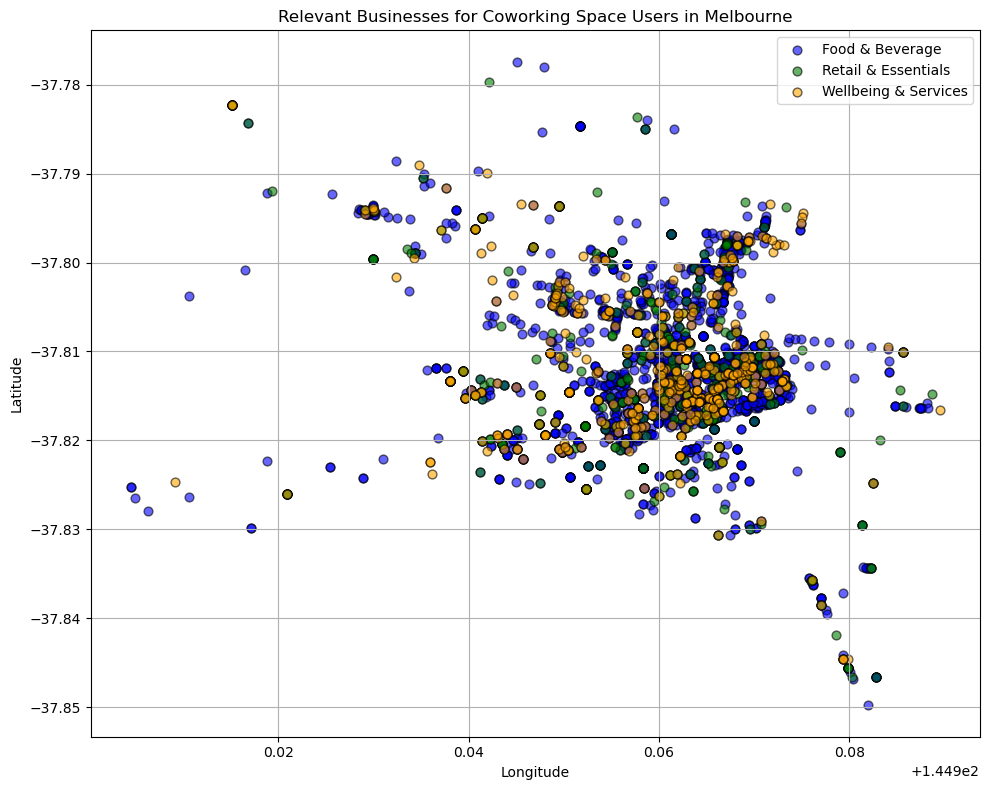

In [106]:
# Define color mapping for each category
color_map = {
    "Food & Beverage": "blue",
    "Retail & Essentials": "green",
    "Wellbeing & Services": "orange",
}

# Create the plot
plt.figure(figsize=(10, 8))

for category, color in color_map.items():
    subset = filtered_business_df[filtered_business_df['business_category'] == category]
    plt.scatter(subset['longitude'], subset['latitude'], c=color, label=category, alpha=0.6, edgecolors='k', s=40)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Relevant Businesses for Coworking Space Users in Melbourne")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


- Business Density is Highly Concentrated in the CBD

The highest concentration of all three service categories appears within a tight, centralized cluster. This suggests that the Melbourne Central Business District (CBD) offers the most diverse and abundant mix of amenities that are attractive or essential to coworking space users, such as cafes, grocery stores, gyms, and wellness services.

- Food & Beverage Services Are the Most Widely Distributed

The blue dots representing Food & Beverage businesses are more evenly spread across the map, reaching further into surrounding areas beyond the core cluster. This indicates that access to cafes and restaurants is relatively widespread, supporting flexible workspace users who may not be located in the immediate CBD.

- Retail & Essentials and Wellbeing Services Are More Clustered

Both green (Retail & Essentials) and orange (Wellbeing & Services) markers are more densely packed in central zones, with limited presence in outlying areas. This suggests these services tend to follow higher foot traffic and population density, reinforcing the value of placing coworking spaces near mixed-use commercial zones.

- Ideal Coworking Locations Align with Amenity Hotspots

For planners and investors, the overlapping clusters of these business types point to highly serviced areas that may support additional coworking infrastructure. These are places where workers have convenient access to meals, daily necessities, and health services—factors that directly influence coworking space desirability and usage.

#### Visualisation of tram stops and bus stops

This code creates a scatter plot that visualizes the geographic locations of tram stops, bus stops, and coworking spaces in Melbourne’s Central Business District (CBD). Each type of location is represented with a different shape and color, making it easy to distinguish between them on the map.

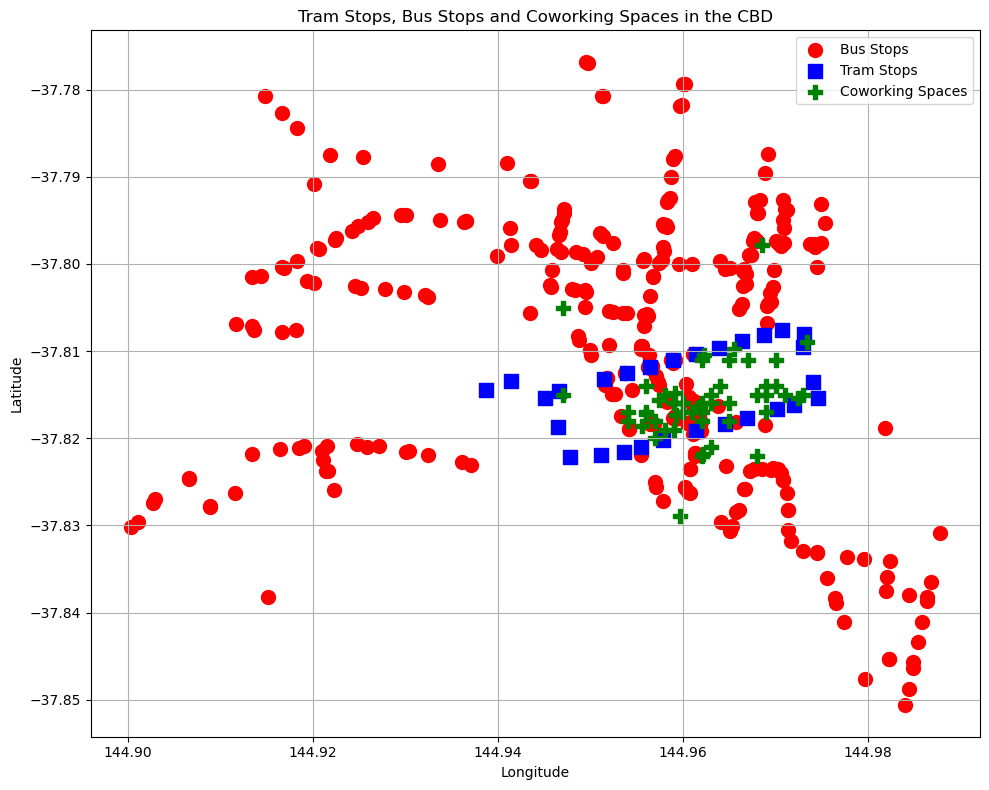

In [107]:
# Plot the data
plt.figure(figsize=(10, 8))
plt.scatter(bus_clean['longitude'], bus_clean['latitude'],
            marker='o', color='red', label='Bus Stops', s=100)
plt.scatter(tram_clean['longitude'], tram_clean['latitude'],
            marker='s', color='blue', label='Tram Stops', s=100)
plt.scatter(coworking_clean['longitude'], coworking_clean['latitude'],
            marker='P', color='green', label='Coworking Spaces', s=100)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Tram Stops, Bus Stops and Coworking Spaces in the CBD")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


- Coworking spaces cluster densely in the tram-accessible area

Most coworking spaces appear to be concentrated in a relatively tight cluster that closely overlaps with the tram stop network. This suggests that tram accessibility is a major factor in the location of coworking hubs, likely because trams offer a reliable and central mode of transport for inner-city commuters.

- Bus stops are widely distributed beyond the coworking core

Bus stops are more broadly scattered across the map, covering peripheral and suburban areas of the CBD and beyond. However, there is less overlap between bus stop locations and coworking spaces, which implies that bus networks may serve a different commuter segment, or that they are used more to support surrounding residential zones rather than coworking precincts.

- Multi-modal transport connectivity is strongest in the coworking zone

The zone with the highest density of coworking spaces is also well-covered by both tram and bus networks, indicating multi-modal transport access. This connectivity is likely a strategic advantage for coworking space operators, catering to a variety of commuter preferences and enhancing location appeal.

- Opportunity for expansion may exist in well-connected but underutilized zones

In areas where tram or bus stops are present without many coworking spaces nearby, there may be untapped potential for new coworking developments. City planners and investors could explore these areas as candidates for strategic expansion, especially if other amenities are also present (e.g., food, retail, gyms).


#### Visualisation of Coworking Spaces on the Map

In [108]:
# Average lat/lon for center
melbourne_center = [coworking_clean['latitude'].mean(), coworking_clean['longitude'].mean()]
coworking_map = folium.Map(location=melbourne_center, zoom_start=15)

# Add coworking space markers
for _, row in coworking_clean.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=f"<b>{row['organisation']}</b><br>{row['address']}<br>{row['website']}",
        icon=folium.Icon(color='blue', icon='briefcase', prefix='fa')
    ).add_to(coworking_map)


# Display the map
coworking_map


From the above map, all Coworking Spaces in the CBD are highlighted in blue color. When users click on these markers, coworking spaces adresses and their websites can be seen.
It is noticeable that coworking spaces are centered in particular areas in CBD, while there could be high demands for coworking spaces in the Southern suburbs and Northern suburbs as well. These are also areas with high density of local services. If coworking spaces are more spread out, these local services can benefit from remote-working customers.

#### Visualisation of Coworking Spaces and Nearby Services on the Map

Next, a map for all coworking spaces users will be created. The aim of this map is for user to quickly find a coworking space and also can view its nearby public transportation (bus stops and tram stops), cafe/restaurants, supermarkets or wellbeing services. To make it more interactive, user can choose which service are they looking for by clicking on a toggle with layers of services. For example, if they are looking for a nearby bus stop, they just need to choose "Bus Stops" from the map and they can see all bus stops and how close they are to each coworking spcae.

In [186]:
# Center map on Melbourne
coworking_full_map = folium.Map(location=melbourne_center, zoom_start=15)

# Create main toggleable group
main_group = folium.FeatureGroup(name="Nearby Services", show=True).add_to(coworking_full_map)

# Coworking space markers (not clustered)
for _, row in coworking_clean.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        tooltip=f"<b>{row['organisation']}</b><br>{row['address']}<br>{row['website']}",
        icon=folium.Icon(color='blue', icon='briefcase', prefix='fa')
    ).add_to(coworking_full_map)

This section of the code creates the base map that centers on Melbourne and plots each coworking space as a blue marker with a briefcase icon. The map is initialized using the average latitude and longitude of all coworking spaces to ensure it’s centered correctly, and a zoom level of 15 is used to provide a street-level view. A toggleable layer group named “Nearby Services” is also created in preparation for adding public transport and business service layers later on. 

The core of this section is a loop that goes through each coworking space in the dataset and places a marker at its exact location. Each marker includes a tooltip that displays the organisation’s name, address, and website when hovered over. This provides users with a clear and informative visual overview of coworking space options in Melbourne, forming the foundation for more detailed exploration of surrounding amenities.

In [187]:
# Bus stops
bus_group = FeatureGroupSubGroup(main_group, "Bus Stops", show=False)
coworking_full_map.add_child(bus_group)
for _, row in bus_clean.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup="Bus Stop",
        icon=folium.Icon(color='green', icon='bus', prefix='fa')
    ).add_to(bus_group)

# Tram stops
tram_group = FeatureGroupSubGroup(main_group, "Tram Stops", show=False)
coworking_full_map.add_child(tram_group)
for _, row in tram_clean.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup="Tram Stop",
        icon=folium.Icon(color='red', icon='subway', prefix='fa')
    ).add_to(tram_group)

This section of the code adds layers of public transport information—specifically bus stops and tram stops—to the interactive coworking map. It begins by creating a subgroup called "Bus Stops" under the main toggleable group "Nearby Services". This subgroup is not shown by default (show=False), meaning the bus stop markers will only appear if the user actively selects that layer. The code then goes through each bus stop in the dataset (bus_clean) and adds a green marker with a bus icon at the appropriate location. E

Each marker includes a simple popup label that says “Bus Stop.” The same approach is applied for tram stops: a separate subgroup called "Tram Stops" is created, also hidden by default, and then red markers with subway icons are placed for each tram stop listed in the dataset (tram_clean). These layers allow users to toggle transport options on the map, making it easier to assess the accessibility of coworking spaces via public transit, which is highly relevant for remote workers, commuters, and urban planners.

In [188]:
# Business categories
category_icons = {
    "Food & Beverage": "utensils",
    "Retail & Essentials": "store",
    "Wellbeing & Services": "dumbbell",
}
for category, icon in category_icons.items():
    category_group = FeatureGroupSubGroup(main_group, category, show=False)
    coworking_full_map.add_child(category_group)
    subset = filtered_business_df[filtered_business_df['business_category'] == category]
    for _, row in subset.iterrows():
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=f"<b>{row['trading_name']}</b><br>{row['business_address']}",
            icon=folium.Icon(color='gray', icon=icon, prefix='fa')
        ).add_to(category_group)

This portion of the code adds business establishments to the map, grouped into three meaningful categories: Food & Beverage, Retail & Essentials, and Wellbeing & Services. Each category is represented with an intuitive Font Awesome icon—for example, utensils for food, a store icon for retail, and a dumbbell for health and wellness services. For each category, a corresponding subgroup is created under the “Nearby Services” layer, but hidden by default (show=False) so that users can choose to view them only when needed. The code then filters the dataset (filtered_business_df) to select businesses that belong to each category and plots them as gray markers on the map. 

Each marker shows a popup with the business’s name and address. This feature allows users—particularly remote workers and city planners—to explore what types of services surround coworking spaces, such as nearby cafes, gyms, and convenience stores, helping them assess how suitable and well-supported each location might be.

In [ ]:
# Layer control
folium.LayerControl(collapsed=False).add_to(coworking_full_map)

#legend with icons
legend_html = """
<link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/font-awesome/6.4.0/css/all.min.css">
<div style="position: fixed;
            bottom: 50px; left: 50px; width: 300px; height: 180px;
            background-color: white; border:2px solid grey; z-index:1000; font-size:14px;
            padding: 10px;">
<b>Legend</b><br><br>
<i class="fas fa-utensils" style="color:red;"></i> Food & Beverage<br>
<i class="fas fa-store" style="color:red;"></i> Retail & Essentials<br>
<i class="fas fa-dumbbell" style="color:red;"></i> Wellbeing & Services<br>
<i class="fas fa-briefcase" style="color:blue;"></i> Coworking Spaces<br>
<i class="fas fa-bus" style="color:green;"></i> Bus Stops<br>
<i class="fas fa-subway" style="color:red;"></i> Tram Stops<br>
</div>
"""
coworking_full_map.get_root().html.add_child(folium.Element(legend_html))

# Display the map
coworking_full_map


This final section of the code adds two key user interface features to the interactive coworking map: a layer control toggle and a visual legend using icons. First, folium.LayerControl(collapsed=False) is added, which enables a menu on the top-right corner of the map. This menu allows users to selectively show or hide different layers—such as bus stops, tram stops, and business categories—making it easy to explore the map based on personal interests or planning needs. 

Next, the code defines a custom HTML block that creates a fixed-position legend at the bottom-left corner of the screen. This legend uses Font Awesome icons and colors to clearly explain what each symbol on the map represents: red icons for food, retail, and wellbeing services; a blue briefcase for coworking spaces; and transport icons for bus and tram stops. The legend helps users quickly interpret the markers on the map without needing prior knowledge, enhancing the map’s accessibility and user experience. Finally, the map is displayed with all these interactive and visual features integrated, resulting in a powerful tool for discovering and evaluating coworking spaces and nearby services in Melbourne.

#### Clustered Map of Coworking Spaces and Nearby Services Density

This section of the use case creates an interactive map designed to help city planners and coworking space investors make informed, data-driven decisions about where to expand or invest. The map visualises the locations of existing coworking spaces in Melbourne, and adds clustered layers for key nearby services—such as public transport (bus and tram stops) and local businesses in categories like food, retail, and wellbeing.

By using marker clusters, the map efficiently handles dense areas, grouping nearby service points into expandable clusters that reveal detailed information upon zoom or click. This allows users to quickly assess the intensity of nearby amenities and accessibility via public transport around each coworking space.

The overall goal is to identify high-potential areas for coworking expansion—places that are not only well connected but also supported by a rich mix of services that attract freelancers, entrepreneurs, and remote workers. This visualisation supports strategic urban development, business planning, and community integration initiatives.

In [190]:
# Center the map on Melbourne
melbourne_center = [coworking_clean['latitude'].mean(), coworking_clean['longitude'].mean()]
folium_map = folium.Map(location=melbourne_center, zoom_start=13)

# MarkerCluster to group all toggled layers
cluster_group = folium.FeatureGroup(name="Nearby Services", show=True).add_to(folium_map)
master_cluster = MarkerCluster().add_to(cluster_group)


This snippet of code sets up the foundational structure for creating a clean and interactive map of Melbourne that supports marker clustering. It begins by calculating the geographic center of all coworking spaces based on their latitude and longitude values, ensuring that the map is centered appropriately over the city. The map is then initialized with zoom_start=13, which provides a good city-wide view of Melbourne while still allowing enough detail to identify neighborhoods.

Next, a FeatureGroup named "Nearby Services" is added to the map. This group will later be used to organize and toggle layers that show nearby transport and business services. Importantly, a MarkerCluster is added to this group, which allows many map markers to be grouped visually. Rather than displaying hundreds of overlapping markers, the cluster groups them together into a single expandable icon, improving clarity and performance. When users zoom in or click on a cluster, it expands to reveal individual locations. This is a crucial step in making the map user-friendly, especially when dealing with dense areas like the Melbourne CBD where coworking spaces and services are tightly packed.

In [191]:

# Add coworking spaces (always visible)
coworking_group = folium.FeatureGroup(name="Coworking Spaces", show=True).add_to(folium_map)
for _, row in coworking_clean.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"<b>{row['organisation']}</b><br>{row['address']}",
        icon=folium.Icon(color='blue', icon='briefcase', prefix='fa')
    ).add_to(coworking_group)

This part of the code adds coworking spaces to the map as individual markers, allowing users to see exactly where these workspaces are located across Melbourne. A FeatureGroup named "Coworking Spaces" is created so that this layer can be toggled on or off using the map’s layer control. Unlike other service layers, coworking spaces are set to be always visible by default (show=True), since they are the central focus of the map.

The code then loops through each coworking space in the dataset and adds a blue marker at its location, styled with a briefcase icon to visually represent professional or work-related spaces. When a user clicks on a marker, a popup displays the name and address of the coworking space, offering useful context for evaluation.

This layer gives city planners and investors a clear visual reference of the existing coworking infrastructure, which serves as the anchor points for evaluating nearby service density and accessibility.

In [ ]:
# Add bus stops
bus_group = FeatureGroupSubGroup(master_cluster, "Bus Stops")
folium_map.add_child(bus_group)

for _, row in bus_clean.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{'Bus Stop'}",
        icon=folium.Icon(color='green', icon='bus', prefix='fa')
    ).add_to(bus_group)

    # Add tram stops
tram_group = FeatureGroupSubGroup(master_cluster, "Tram Stops")
folium_map.add_child(tram_group)

for _, row in tram_clean.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"{'Tram Stop'}",
        icon=folium.Icon(color='red', icon='subway', prefix='fa')
    ).add_to(tram_group)

This section of the code adds two essential public transport layers—bus stops and tram stops—to the map, grouped under the master_cluster for interactive clustering and improved visibility. Each type of transport stop is organised into its own FeatureGroupSubGroup, allowing users to selectively toggle them on or off using the map’s layer control.

The first block creates a layer for bus stops. It loops through the dataset, and for each stop, it places a green marker with a bus icon at the appropriate location. Each marker includes a popup that labels it simply as “Bus Stop.”

The second block follows the same pattern for tram stops, using the dataset tram_clean. It assigns each tram stop a red marker with a subway icon and adds it to a separate tram layer group.

By clustering these markers under master_cluster, the map remains clean and easy to navigate—even in dense areas—while still offering detailed access to public transport infrastructure. For city planners and coworking space investors, these layers are crucial in assessing transport accessibility, which is a major factor in determining the suitability of a location for new coworking development.

In [193]:
# Add business categories using FeatureGroupSubGroups
category_icons = {
    "Food & Beverage": "utensils",
    "Retail & Essentials": "store",
    "Wellbeing & Services": "dumbbell",
}

for category, icon in category_icons.items():
    group = FeatureGroupSubGroup(master_cluster, category)
    folium_map.add_child(group)
    subset = filtered_business_df[filtered_business_df['business_category'] == category]
    for _, row in subset.iterrows():
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=f"<b>{row['trading_name']}</b><br>{row['business_address']}",
            icon=folium.Icon(color='grey', icon=icon, prefix='fa')
        ).add_to(group)

C:\Users\phuon\AppData\Local\Temp\ipykernel_17812\3073515618.py:16: UserWarning: color argument of Icon should be one of: {'darkgreen', 'pink', 'darkpurple', 'lightblue', 'lightgreen', 'beige', 'purple', 'red', 'blue', 'white', 'black', 'orange', 'darkred', 'lightgray', 'darkblue', 'green', 'lightred', 'cadetblue', 'gray'}.
  icon=folium.Icon(color='grey', icon=icon, prefix='fa')


This section of the code adds local business establishments to the map, grouped by service type to support more meaningful exploration. It uses three main business categories: Food & Beverage, Retail & Essentials, and Wellbeing & Services, each paired with a relevant Font Awesome icon (such as utensils, store, and dumbbell). For each category, the code creates a separate FeatureGroupSubGroup under the master_cluster, allowing users to toggle them individually in the map’s layer control.

The code then filters the filtered_business_df dataset to select only businesses that match the current category. For each business, it places a gray marker on the map with the appropriate icon and includes a popup showing the trading name and address of the establishment. These markers are added into the corresponding sub-group, making it possible to visualize different types of services one layer at a time.

By organising business markers in this way, the map becomes a powerful tool for city planners and coworking investors to evaluate the density and type of nearby services. This is especially useful for identifying high-potential areas where essential amenities already exist—such as restaurants, grocery stores, and fitness centers—which tend to attract remote workers and support a thriving coworking ecosystem.

In [194]:

# Add Layer Control
folium.LayerControl(collapsed=False).add_to(folium_map)

# Add a legend (customized with HTML)
legend_html = """
<link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/font-awesome/6.4.0/css/all.min.css">
<div style="position: fixed;
            bottom: 50px; left: 50px; width: 300px; height: 180px;
            background-color: white; border:2px solid grey; z-index:1000; font-size:14px;
            padding: 10px;">
<b>Legend</b><br><br>
<i class="fas fa-utensils" style="color:red;"></i> Food & Beverage<br>
<i class="fas fa-store" style="color:red;"></i> Retail & Essentials<br>
<i class="fas fa-dumbbell" style="color:red;"></i> Wellbeing & Services<br>
<i class="fas fa-briefcase" style="color:blue;"></i> Coworking Spaces<br>
<i class="fas fa-bus" style="color:green;"></i> Bus Stops<br>
<i class="fas fa-subway" style="color:red;"></i> Tram Stops<br>
</div>
"""

folium_map.get_root().html.add_child(folium.Element(legend_html))
# Show map
folium_map


This final block of code enhances the usability and clarity of the map by adding two important user interface features: a layer control toggle and a custom legend using intuitive icons.
First, folium.LayerControl(collapsed=False) adds a control panel to the map interface, typically located in the top-right corner. This panel allows users to selectively show or hide different layers—such as coworking spaces, business categories, tram stops, and bus stops—making the map interactive and customisable based on the viewer's needs.

Next, the legend_html block defines a visually styled legend using HTML and Font Awesome icons. Positioned at the bottom-left of the map, the legend explains what each icon on the map represents.This legend improves accessibility, making it easy for users—especially city planners and investors—to quickly interpret what they’re seeing on the map without needing prior technical knowledge.
Together, the layer control and icon-based legend create a user-friendly interface that supports strategic exploration of Melbourne’s coworking landscape and its surrounding services.

### Conclusion

This use case demonstrates how spatial data visualisation can support data-driven decisions in urban planning and coworking space investment. By integrating the locations of coworking spaces with nearby public transport infrastructure (tram and bus stops) and essential business services (food, retail, wellbeing), the interactive map and supporting plots provide valuable insights into the accessibility and amenity density across Melbourne’s urban landscape.

#### Observations
- Coworking spaces are highly concentrated in Melbourne's CBD, closely aligned with dense clusters of tram stops and essential services. This suggests that accessibility and surrounding amenities play a major role in site selection and user demand.
- Tram stops show the strongest overlap with coworking locations, indicating that tram accessibility may be more influential than bus connectivity in supporting daily commuting for coworking users.
- Food & Beverage services are the most widely distributed, providing consistent support across a broader area, while Retail & Essentials and Wellbeing & Services tend to cluster around the CBD.
- Several areas with high transport accessibility (especially bus-heavy corridors) lack nearby coworking spaces, pointing to potential gaps in service coverage.


#### Recommendations
Based on the analysis of coworking spaces, public transport, and surrounding business services in Melbourne, the following recommendations are proposed for city planners, urban developers, and coworking space investors:

1. Prioritise Expansion in Transit-Rich Areas
Focus new coworking developments in areas with high tram and bus stop density, especially where service clusters (e.g., food, fitness, retail) already exist but coworking supply is limited. These locations offer strong accessibility and are likely to attract mobile professionals.

2. Leverage Amenity Clusters to Maximise Attractiveness
Coworking locations surrounded by a mix of food & beverage, retail, and wellbeing services are more appealing to users. Prioritise sites where these amenities co-locate to support convenience, work-life balance, and productivity.

3. Use Underserved Transit Corridors as Pilot Zones
Identify bus corridors or fringe-tram zones with existing business density but few coworking options. These could serve as low-risk pilot locations to test demand and validate expansion strategies outside the CBD.

4. Improve Visibility with Interactive Mapping Tools
Deploy an internal or public-facing interactive map dashboard to visualise coworking supply, transit links, and business environments. This would enable data-backed planning and stakeholder engagement across departments and investment teams.

5. Engage in Public–Private Partnerships (PPP)
Coordinate with local councils and transport agencies to explore incentives, co-location models, or zoning flexibility that supports coworking developments in strategic urban nodes.

6. Monitor Business Ecosystem Growth
Establish a monitoring framework to track the emergence of new services, startup clusters, and digital hubs—these are often early indicators of rising demand for coworking spaces in secondary neighborhoods.

7. Ensure Equity in Access
While the CBD is well-served, extend efforts to promote coworking options in growth corridors and outer suburbs to support remote workers, students, and SMEs with limited central access.

By applying these recommendations, stakeholders can make strategic, data-informed decisions that not only meet current demand but also future-proof Melbourne's coworking ecosystem as part of a vibrant, accessible, and inclusive urban economy.
